In [194]:
#import libraries
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

This is a dataframe we created with all paths of all images found in the dataframe

In [195]:
df = pd.read_csv("A1.csv")
df.head()

,Unnamed: 0,paths,c,r,e,n
0,0,DATASET/A1/c1/r1/images/e0/c1r1e0n1.tif,1,1,0,1
1,1,DATASET/A1/c1/r1/images/e0/c1r1e0n2.tif,1,1,0,2
2,2,DATASET/A1/c1/r1/images/e0/c1r1e0n3.tif,1,1,0,3
3,3,DATASET/A1/c1/r1/images/e0/c1r1e0n4.tif,1,1,0,4
4,4,DATASET/A1/c1/r1/images/e0/c1r1e0n5.tif,1,1,0,5


The approach we are going to take is to get a sample of 100x100 of each image, vectorize it so each pixel is going to be a component/feature and attempt to cluster it with kmeans.

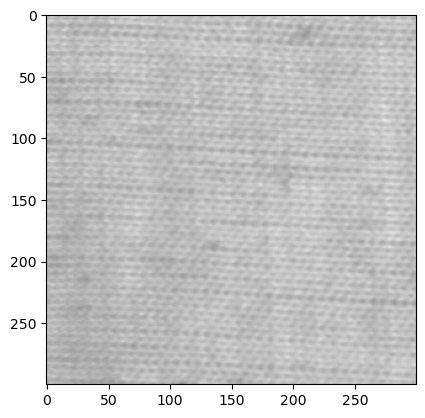

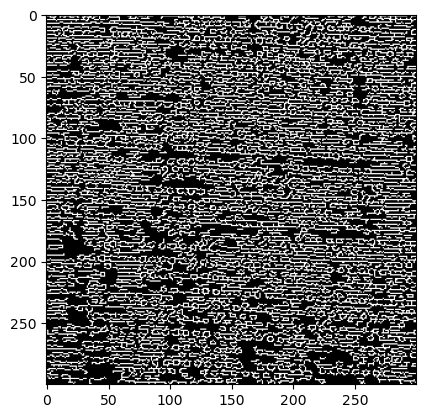

In [217]:
crop = cv2.cvtColor(cv2.imread(df["paths"][400])[0:300,0:300], cv2.COLOR_BGR2GRAY) #load image, crop -> window_size -> convert to grayscale 1ch
edges = cv2.Canny(crop,40,90)
plt.imshow(cv2.cvtColor(crop,cv2.COLOR_GRAY2RGB))
plt.show()
plt.imshow(cv2.cvtColor(edges,cv2.COLOR_GRAY2RGB))
plt.show()


In [314]:
WINDOW_SIZE = 300
samples = [] #list where to append vectors, so sample of each image

for im_path in df["paths"]:
    crop = cv2.cvtColor(cv2.imread(im_path)[0:WINDOW_SIZE,0:WINDOW_SIZE], cv2.COLOR_BGR2GRAY) #load image, crop -> window_size -> convert to grayscale 1ch
    #edges = cv2.Canny(crop,40,90)
    (thresh, bin) = cv2.threshold(crop, 170, 180, cv2.THRESH_BINARY)
    samples.append(list(np.asarray(bin).reshape(-1)))

#convert list of lists -> np matrix
samples = np.matrix(samples)

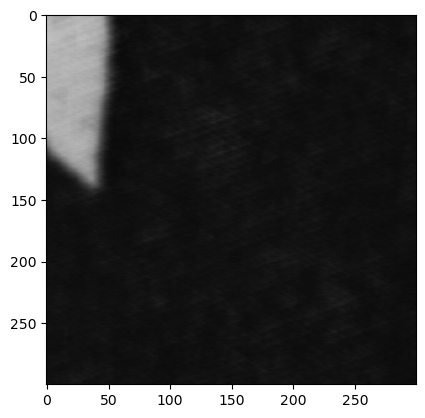

In [315]:
(thresh, bin) = cv2.threshold(crop, 170, 180, cv2.THRESH_BINARY)
plt.imshow(cv2.cvtColor(crop,cv2.COLOR_GRAY2RGB))

In [316]:
#just for debugging, check size of samples matrix, 3148 samples 10000 size vectors 100x100
samples.shape

(3148, 90000)

In [317]:
"""
#Apply normalization
mu = samples.mean(axis=1) # mean values
sigma = samples.std(axis=1) + np.ptp(samples, axis=1)/20.0 # standard deviation (plus a small value)

samples = (samples-mu.reshape([-1,1]))/(sigma.reshape([-1,1])) # subtract the mean and divide by std

# Set NaN values (if exist) to 0
w = np.isnan(samples)
samples[w] = 0
"""

'\n#Apply normalization\nmu = samples.mean(axis=1) # mean values\nsigma = samples.std(axis=1) + np.ptp(samples, axis=1)/20.0 # standard deviation (plus a small value)\n\nsamples = (samples-mu.reshape([-1,1]))/(sigma.reshape([-1,1])) # subtract the mean and divide by std\n\n# Set NaN values (if exist) to 0\nw = np.isnan(samples)\nsamples[w] = 0\n'

In [318]:
#apply kmeans
NUM_CLUST =5

km = KMeans(n_clusters=NUM_CLUST, max_iter=50, n_init=1, verbose=False)
km.fit(samples)

/Users/josepsmachine/miniforge3/envs/chaos/lib/python3.10/site-packages/sklearn/utils/validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


KMeans(max_iter=50, n_clusters=5, n_init=1, verbose=False)

In [319]:
#save kmean generated label for each image
df = df.assign(km_label=km.labels_)

Now we print 

In [320]:
df.shape

(3148, 7)

km_label:  0


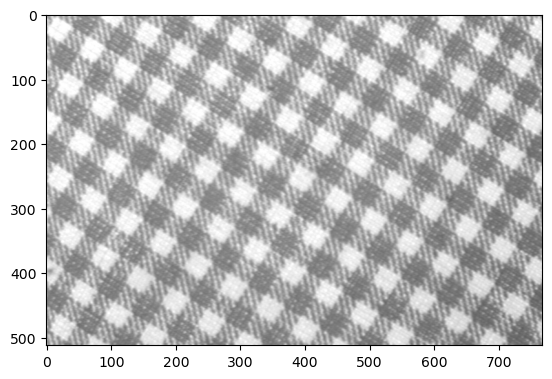

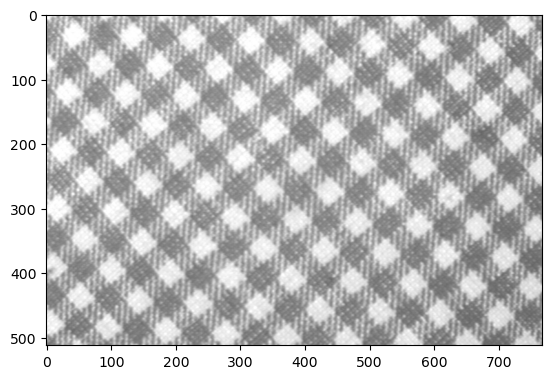

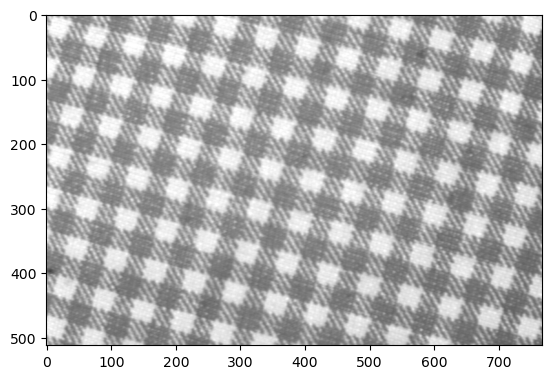

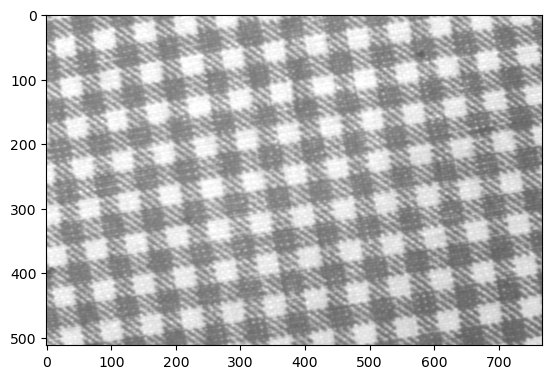

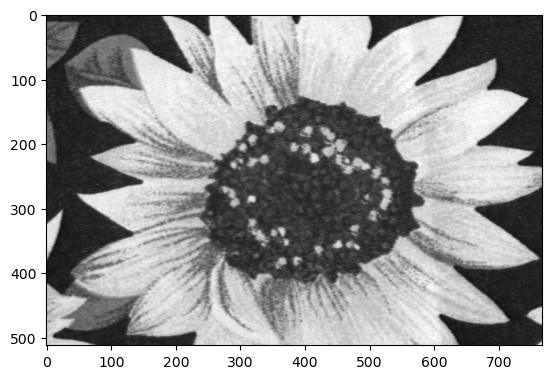

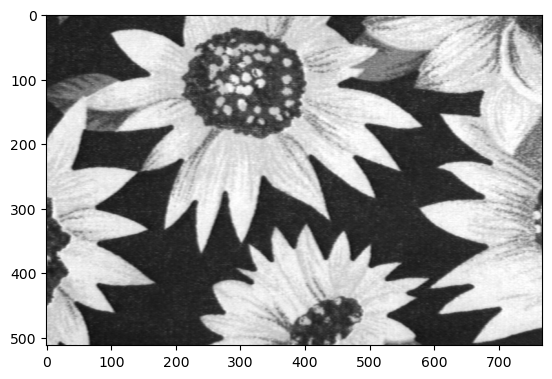

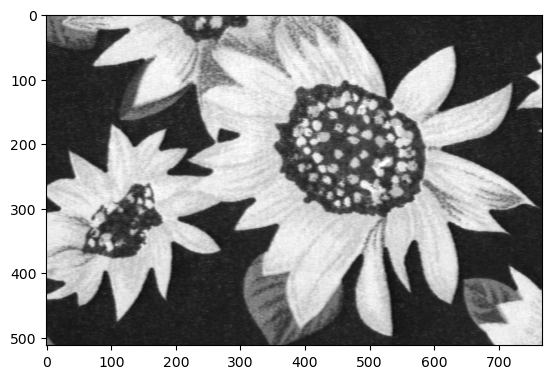

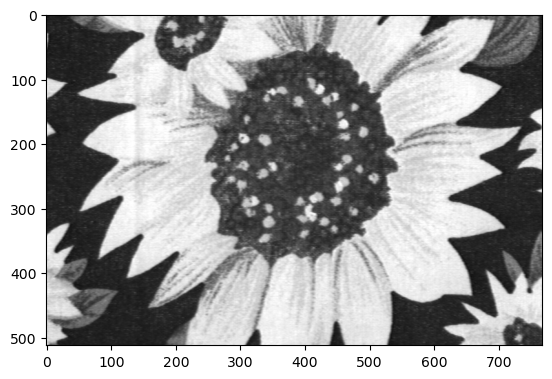

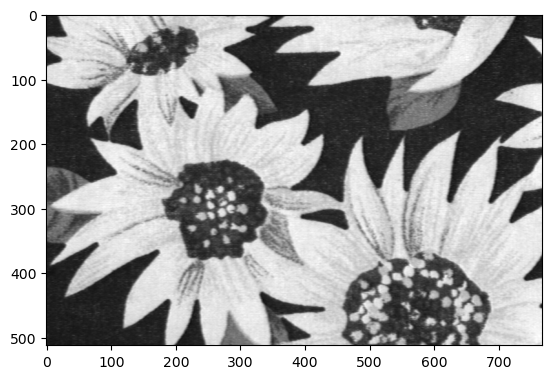

km_label:  1


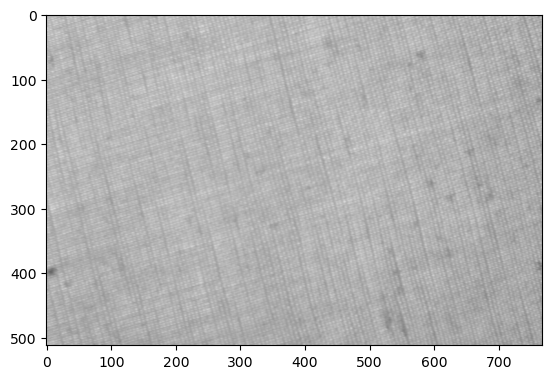

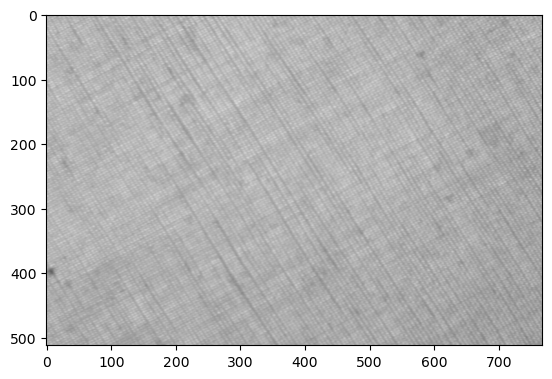

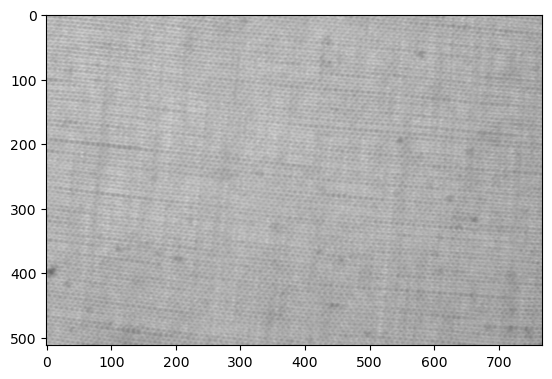

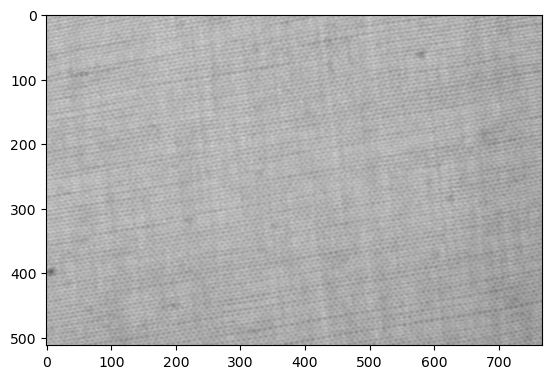

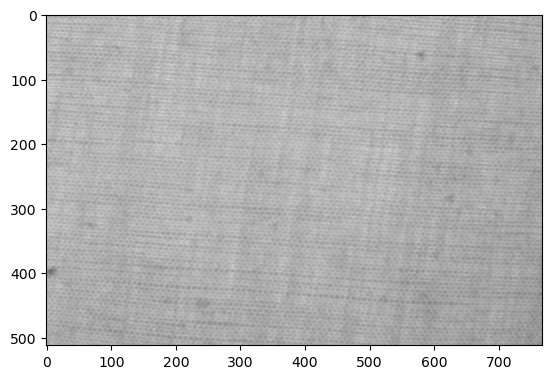

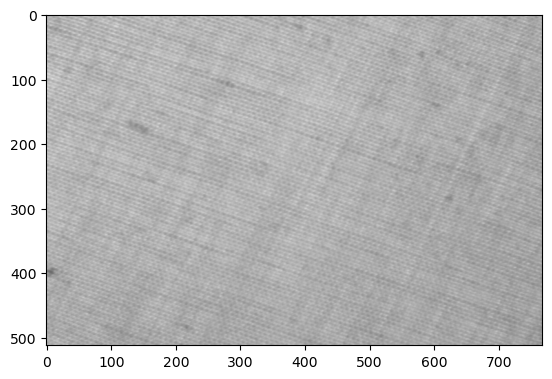

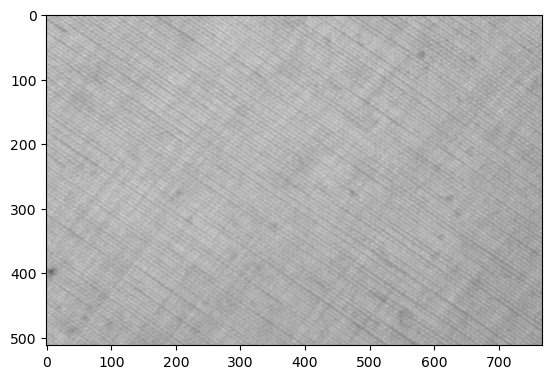

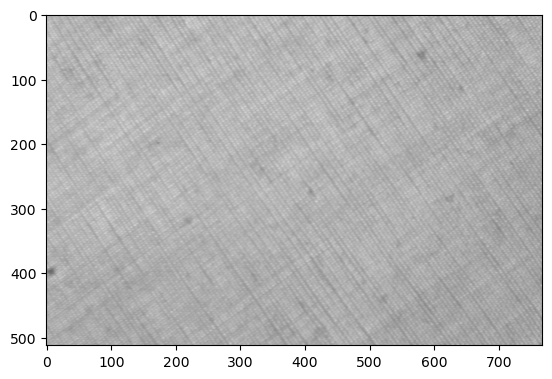

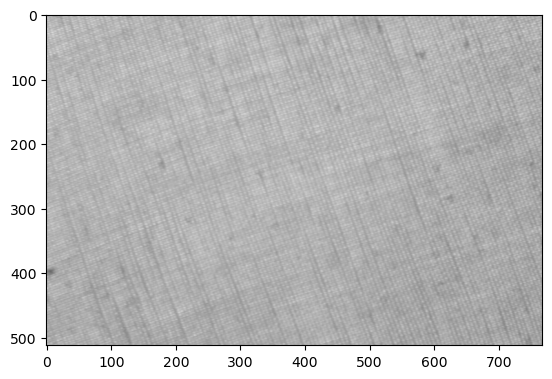

km_label:  2


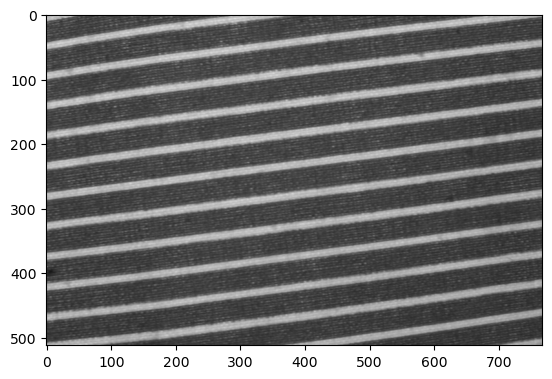

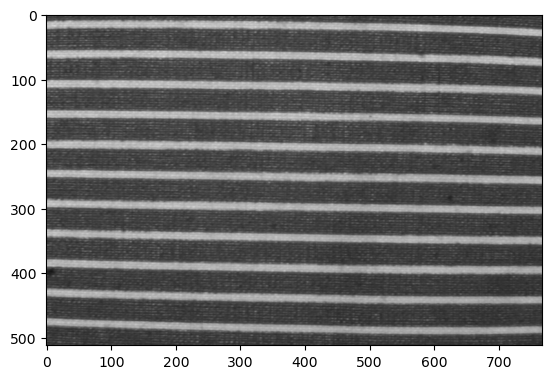

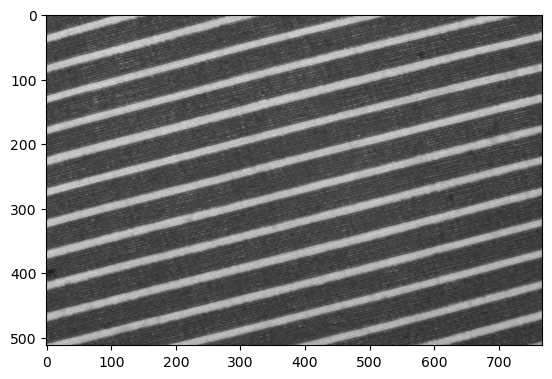

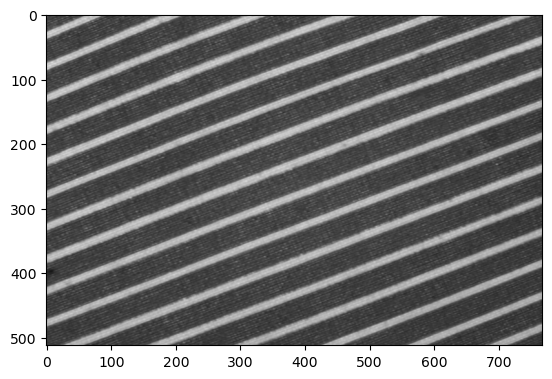

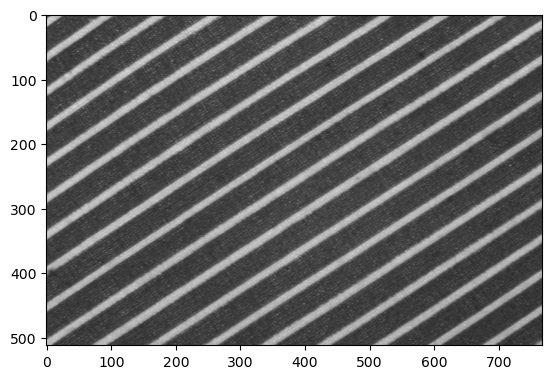

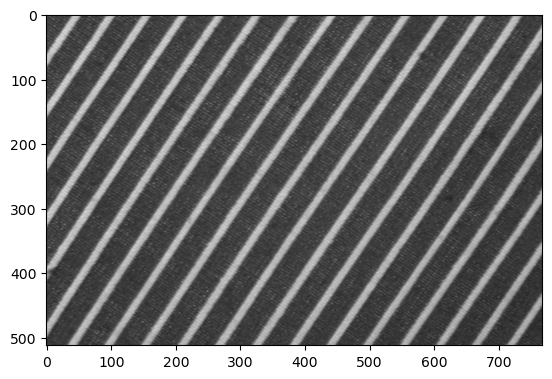

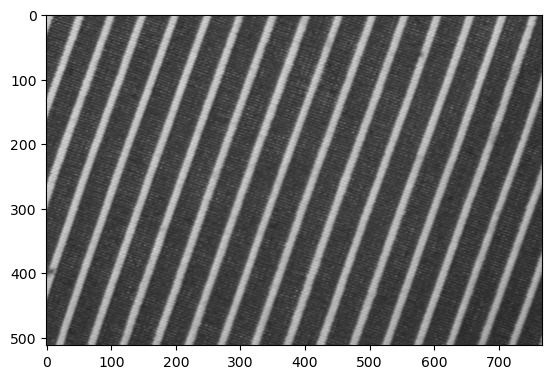

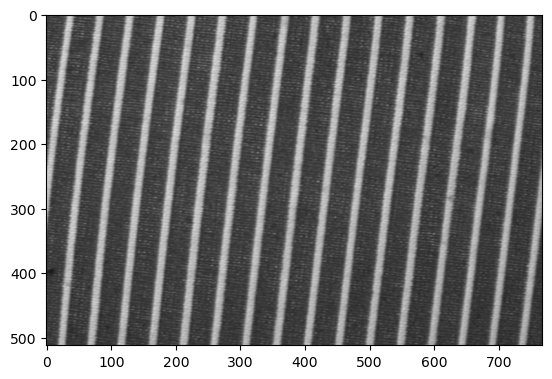

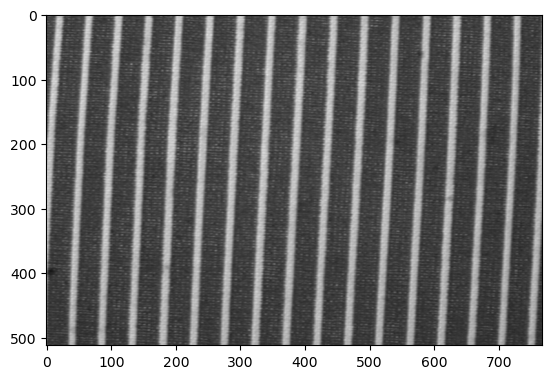

km_label:  3
km_label:  4


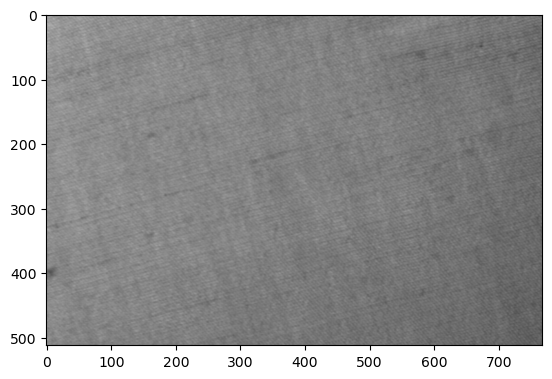

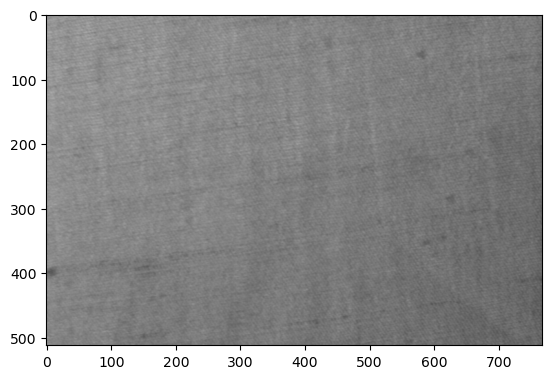

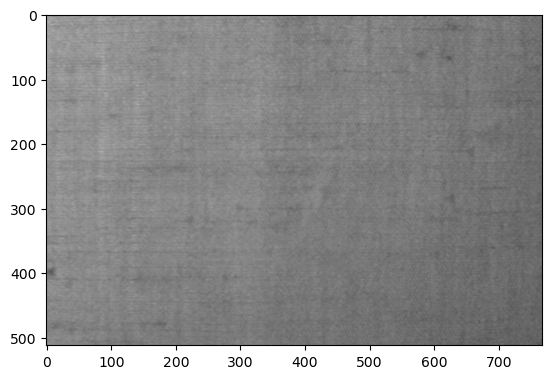

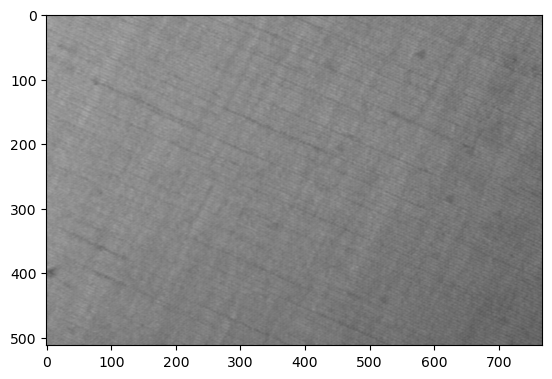

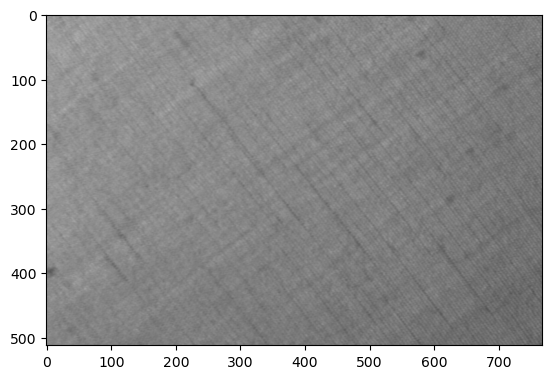

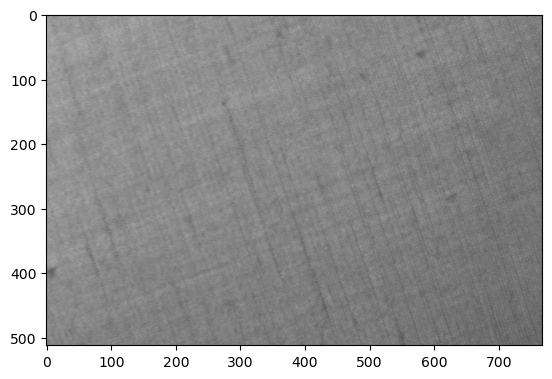

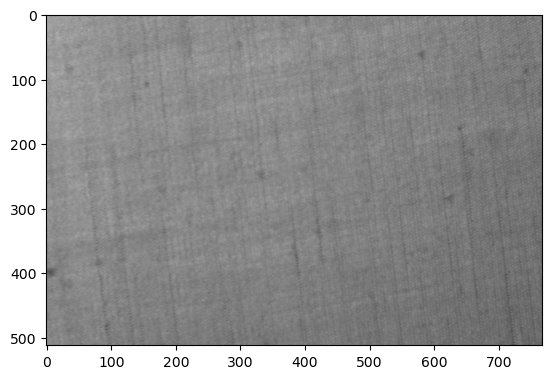

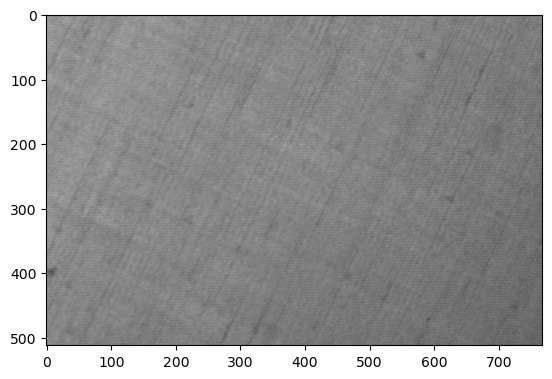

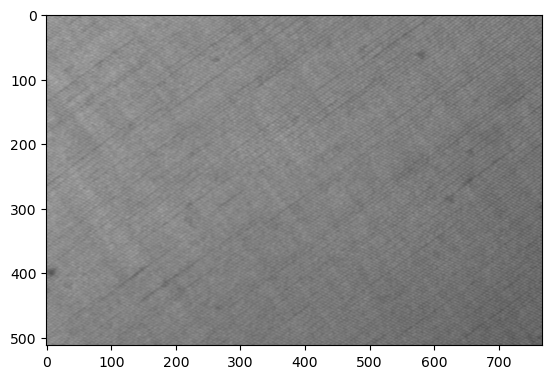

In [321]:
for i in range(5):
    cluster_ex = df[(df["km_label"]==i) & (df["e"]==0)][31:40].paths
    print("km_label: ",i)
    for pth in cluster_ex:
        image = cv2.imread(pth)
        plt.imshow(image)
        plt.show()

c:2,r:2,e:4,n:1,label:4


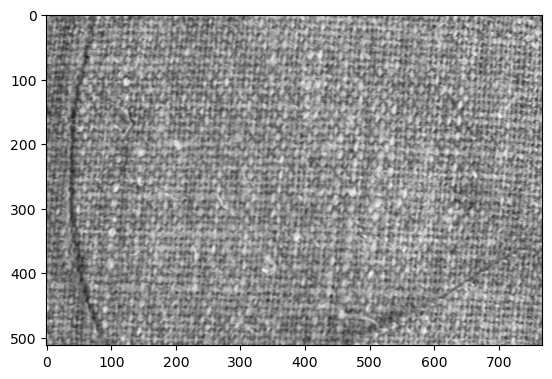

c:2,r:2,e:4,n:2,label:2


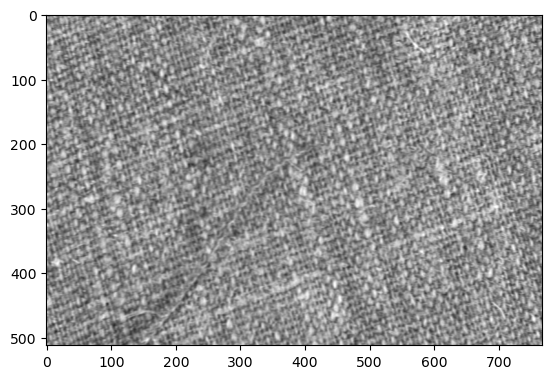

c:2,r:2,e:4,n:3,label:2


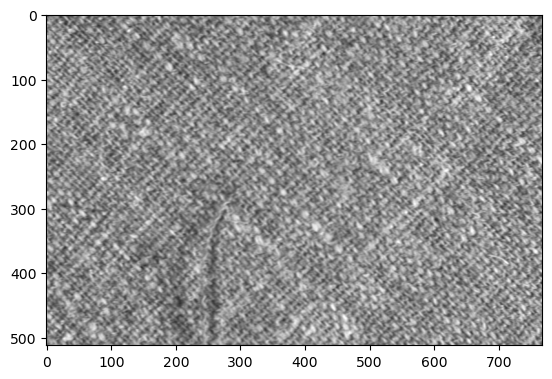

c:2,r:2,e:4,n:4,label:2


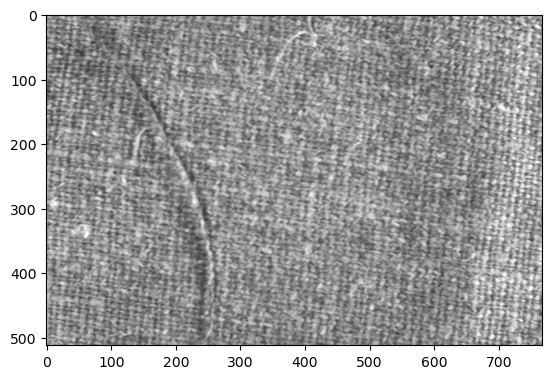

c:2,r:2,e:4,n:5,label:2


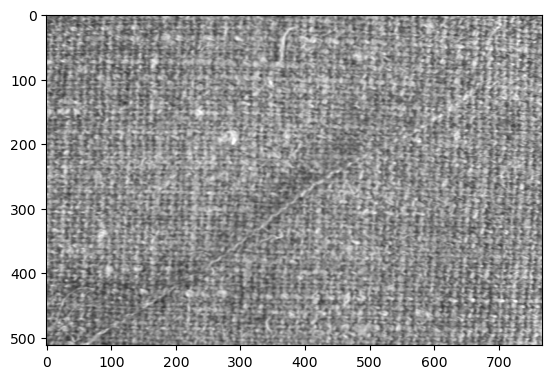

c:2,r:2,e:4,n:6,label:4


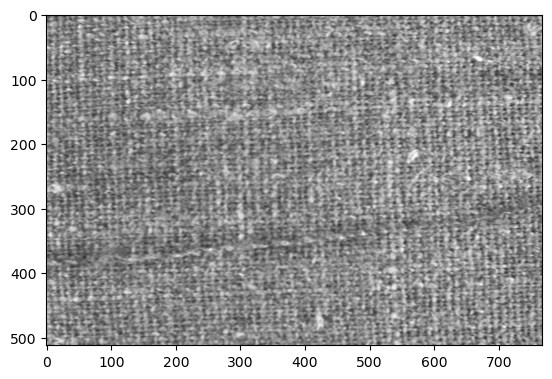

c:2,r:2,e:4,n:7,label:4


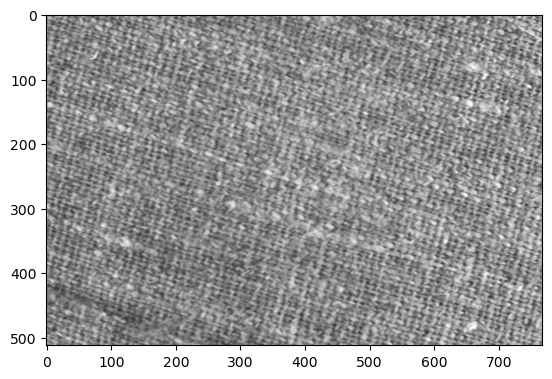

c:2,r:2,e:4,n:8,label:4


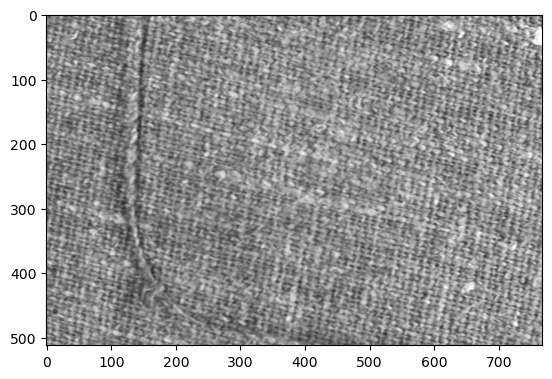

c:2,r:2,e:4,n:9,label:4


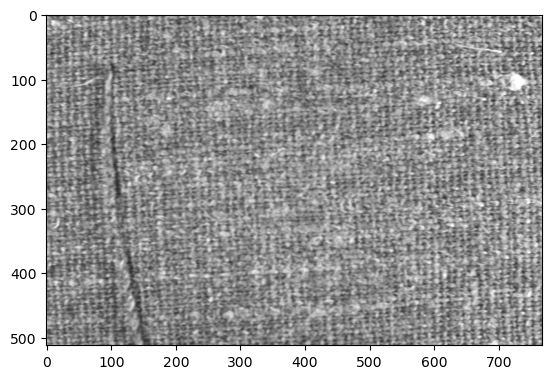

c:2,r:2,e:4,n:10,label:4


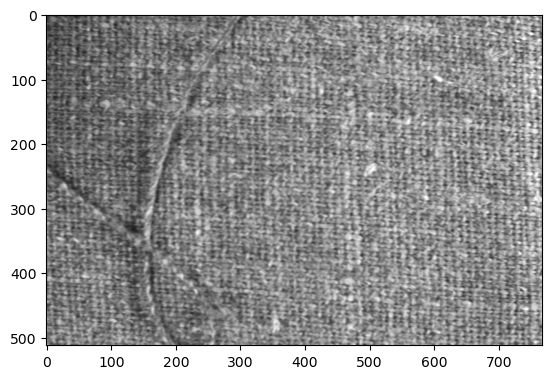

c:2,r:2,e:4,n:11,label:2


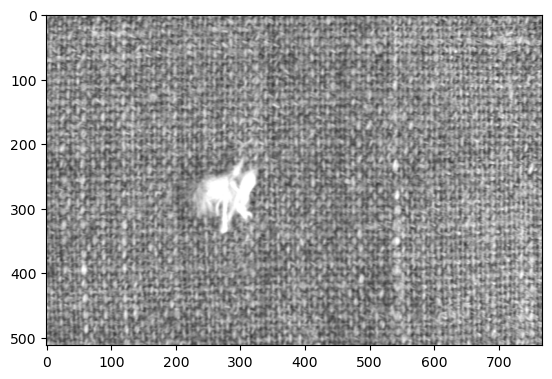

c:2,r:2,e:4,n:12,label:2


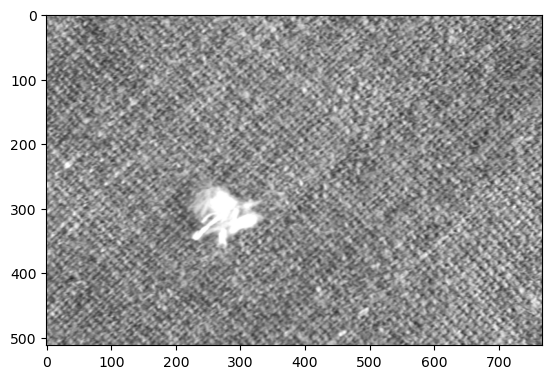

c:2,r:2,e:4,n:13,label:4


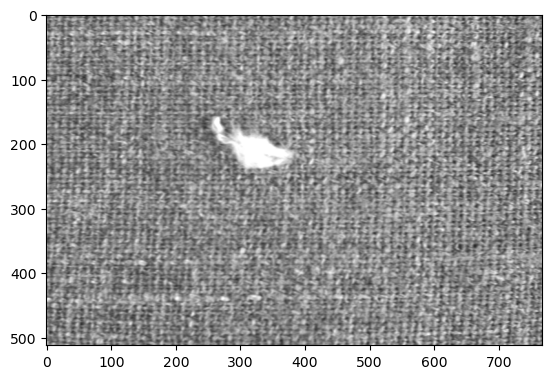

c:2,r:2,e:4,n:14,label:4


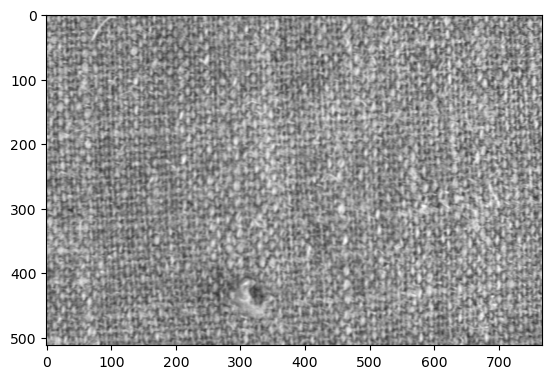

c:2,r:2,e:4,n:15,label:4


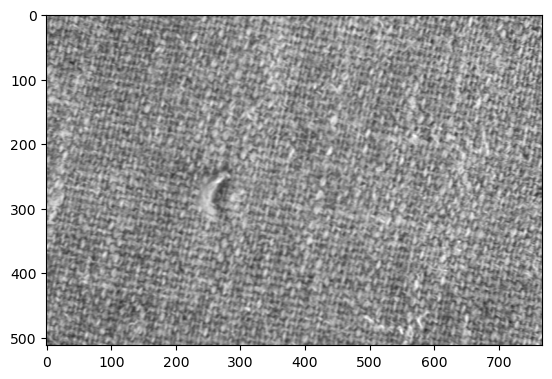

c:2,r:2,e:4,n:16,label:4


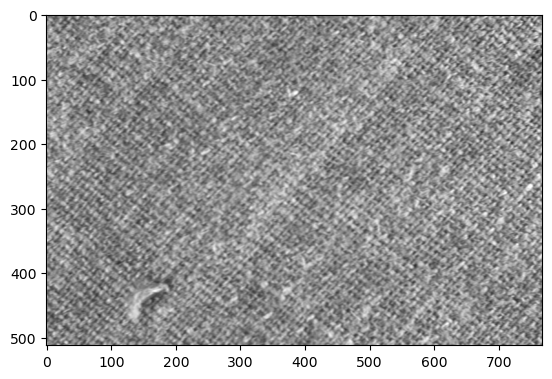

c:2,r:2,e:4,n:17,label:4


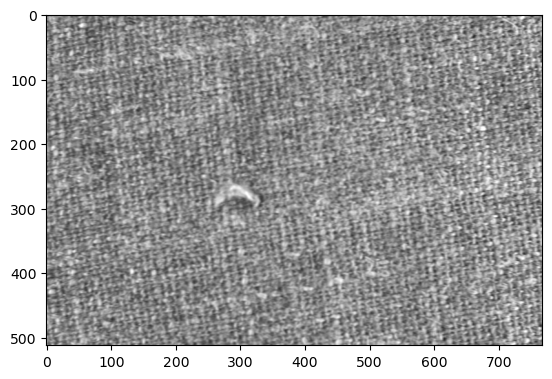

c:2,r:2,e:4,n:18,label:4


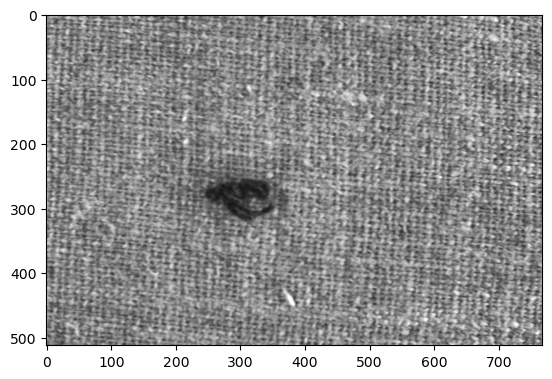

c:2,r:2,e:4,n:19,label:4


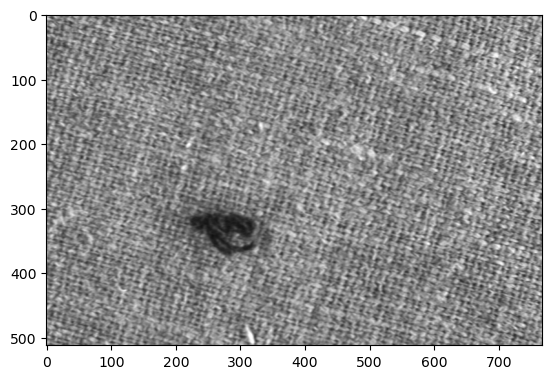

c:2,r:2,e:4,n:20,label:4


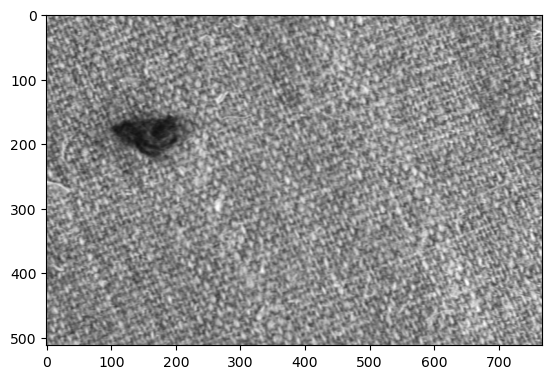

In [322]:
for i in range(1000,1020):
    print("c:"+str(df["c"][i])+",r:"+str(df["r"][i])+",e:"+str(df["e"][i])+",n:"+str(df["n"][i])+",label:"+str(df["km_label"][i]))
    image = cv2.imread(df["paths"][i])
    plt.imshow(image)
    plt.show()



In [323]:
img = cv2.cvtColor(cv2.imread("DATASET/A1/c1/r1/images/e0/c1r1e0n1.tif"), cv2.COLOR_BGR2GRAY)
crp = image[0:100,0:100]
km.predict(np.asarray(crp).reshape(1,-1))

ValueError: X has 30000 features, but KMeans is expecting 90000 features as input.

In [ ]:
import cv2
crop = img_grey[0:100, 0:100]
samples_df = pd.DataFrame(columns=np.append(["paths"],)
for im_path in df["paths"][0:10]:
    image = cv2.cvtColor(cv2.imread(im_path), cv2.COLOR_BGR2GRAY)
    crop = image[0:100,0:100]
    samples_df(list(np.asarray(crop).reshape(-1)))
    data["paths"].append(im_path)
